# Проект

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве.
Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.

Наша цель — подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

Постарайтесь сделать презентацию информативной и лаконичной. Её структура и оформление сильно влияют на восприятие информации читателями вашего исследования. Выбирать инструменты (matplotlib, seaborn и другие) и типы визуализаций вы можете самостоятельно.

Нам доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

## План работы:

1. **Изучение файла**


2. **Предобработка данных:**
- проверка дубликатов
- проверка пропусков
- проверка выбросов
- создание столбца street с названиями улиц из столбца с адресом
- создание столбца is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7)

3. **Анализ данных**
- Какие категории заведений представлены в данных?
- Количество посадочных мест в местах по категориям
- Соотношение сетевых и несетевых заведений в датасете. Каких заведений больше?
- Какие категории заведений чаще являются сетевыми?
- Топ-15 популярных сетей в Москве.
- Какие административные районы Москвы присутствуют в датасете?
- Сильно ли различаются усреднённые рейтинги в разных типах общепита?
- Фоновая картограмма (хороплет) со средним рейтингом заведений каждого района.
- Все заведения датасета на карте с помощью кластеров средствами библиотеки folium.
- Топ-15 улиц по количеству заведений.
- Улицы, на которых находится только один объект общепита.
- Как удалённость от центра влияет на цены в заведениях?
- Обобщенный вывод по пунктам выше.

4. **Детализируем исследование: открытие кофейни:**

- Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?
- Есть ли круглосуточные кофейни?
- Какие у кофеен рейтинги? Как они распределяются по районам?
- На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?
- Сколько кофеен являются сетевыми?
- Вывод и рекомендации по открытию.

5. **Подготовка презентации**


6. **Общий вывод**
   
На основе этого плана мы приступим к анализу данных Яндекс Карт и Яндекс Бизнес, с целью выявить необходимые инсайты по рынку общественного питания в Москве, а также инсайты для открытия в будущем новой кофейни.

## Загрузка данных

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from folium import Choropleth, Marker
from folium.plugins import MarkerCluster

In [ ]:
try:
    data = pd.read_csv('/datasets/moscow_places.csv')
except:
    data = pd.read_csv('moscow_places.csv')

In [ ]:
data.info()
data.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [ ]:
# узнаем, сколько всего заведений представлено в датасете
data['name'].nunique()

5614

В датасете 5614 заведений.

Всего в датасете 8406 строк, 14 столбцов:
- `name` — название заведения;
- `address` — адрес заведения;
- `category` — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- `hours` — информация о днях и часах работы;
- `lat` — широта географической точки, в которой находится заведение;
- `lng` — долгота географической точки, в которой находится заведение;
- `rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- `price` — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- `avg_bill` — строка, которая хранит среднюю стоимость заказа в виде диапазона;
- `middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»;
- `middle_coffee_cup` — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»;
- `chain` — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
    0 — заведение не является сетевым,
    1 — заведение является сетевым;
- `district` — административный район, в котором находится заведение, например Центральный административный округ;
- `seats` — количество посадочных мест.

Есть пропуски в некоторых столбцах, которые касаются часов работы, среднего чека и количества посадочных мест. Столбцы хранят разные типы данных: строчные и числовые.

## Предобработка данных

### Дубликаты, пропуски и выбросы

In [ ]:
# проверим на явные дубликаты
data.duplicated().sum()

0

In [ ]:
# приводим столбец к нижнему регистру
data['name'] = data['name'].str.lower()
data['address'] = data['address'].str.lower()

In [ ]:
# проверим неявные дубликаты по названию и адресу заведения, выведем сумму
data.duplicated(subset=['name', 'address']).sum()

4

In [ ]:
# удалим неявные дубликаты
data = data.drop_duplicates(subset=['name', 'address']).reset_index(drop=True)
len(data)

8402

In [ ]:
# проверим пропуски, посмотрев заново общую информацию о датасете
data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 535
lat                     0
lng                     0
rating                  0
price                5087
avg_bill             4586
middle_avg_bill      5253
middle_coffee_cup    7867
chain                   0
seats                3610
dtype: int64

Пропуски есть в столбцах: hours, price, avg_bill, middle_avg_bill, middle_coffee_cup, seats. Их очень большое количество, поэтому удалить нельзя, а исправить крайне сложно. Для дальнейшей работы над проектом нам потребуются столбцы middle_avg_bill и seats.

In [ ]:
data['avg_bill'].unique()

array([nan, 'Средний счёт:1500–1600 ₽', 'Средний счёт:от 1000 ₽',
       'Цена чашки капучино:155–185 ₽', 'Средний счёт:400–600 ₽',
       'Средний счёт:199 ₽', 'Средний счёт:200–300 ₽',
       'Средний счёт:от 500 ₽', 'Средний счёт:1000–1200 ₽',
       'Цена бокала пива:250–350 ₽', 'Средний счёт:330 ₽',
       'Средний счёт:1500 ₽', 'Средний счёт:300–500 ₽',
       'Средний счёт:140–350 ₽', 'Средний счёт:350–500 ₽',
       'Средний счёт:300–1500 ₽', 'Средний счёт:от 240 ₽',
       'Средний счёт:200–250 ₽', 'Средний счёт:328 ₽',
       'Средний счёт:300 ₽', 'Средний счёт:от 345 ₽',
       'Средний счёт:60–400 ₽', 'Средний счёт:900 ₽',
       'Средний счёт:500–800 ₽', 'Средний счёт:500–1000 ₽',
       'Средний счёт:600–700 ₽', 'Цена бокала пива:120–350 ₽',
       'Средний счёт:1000–1500 ₽', 'Средний счёт:1500–2000 ₽',
       'Цена чашки капучино:150–190 ₽', 'Средний счёт:2000–2500 ₽',
       'Средний счёт:600 ₽', 'Средний счёт:450 ₽',
       'Цена чашки капучино:120–170 ₽', 'Средний счё

В столбец `middle_avg_bill` входит число с оценкой среднего чека, которое указано только для значений из столбца `avg_bill`, начинающихся с подстроки "Средний счёт". Количество пропусков обосновано тем, что в столбце есть не только "средний чек", но также "цена чашки капучино" и "цена бокала пива".

In [ ]:
# рассмотрим столбец по количество посадочных мест
data['seats'].describe()

count    4792.000000
mean      108.361436
std       122.841130
min         0.000000
25%        40.000000
50%        75.000000
75%       140.000000
max      1288.000000
Name: seats, dtype: float64

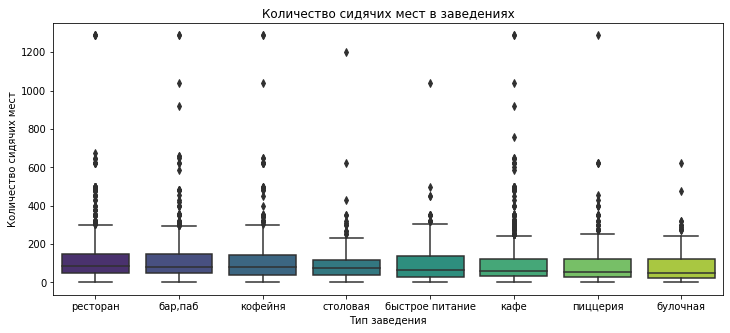

In [ ]:
# группировка данных по категориям и подсчет медианы количества сидячих мест в каждой категории
median_seats_by_category = data.groupby('category')['seats'].median().sort_values(ascending=False)

# создание boxplot с сортировкой по медиане
plt.figure(figsize=(12, 5))
sns.boxplot(y='seats', x='category', data=data, dodge=False, palette='viridis', order=median_seats_by_category.index)
plt.title('Количество сидячих мест в заведениях')
plt.xlabel('Тип заведения')
plt.ylabel('Количество сидячих мест')
plt.show()

In [ ]:
len(data.query('seats > 500')) / len(data) * 100

0.6665079742918353

По графику можно сказать, что количество сидячих мест более 500 является аномальным значением. Строки с выбросами в столбце `seats` = 0.66% от общего датасета, значит, мы можем их удалить. В то время как минимальное значение (=0) является неаномальным, так как в датасете находятся не только рестораны и кафе.

In [ ]:
data_500 = data[data['seats'] > 500]
data = data.query('index not in @data_500.index')

In [ ]:
# проверим средний ценник чашки кофе
data['middle_coffee_cup'].describe()

count     529.000000
mean      174.725898
std        89.225235
min        60.000000
25%       125.000000
50%       169.000000
75%       225.000000
max      1568.000000
Name: middle_coffee_cup, dtype: float64

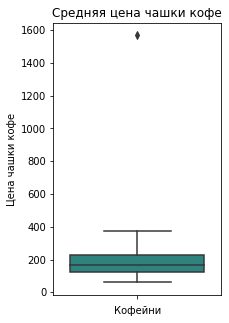

In [ ]:
plt.figure(figsize=(3, 5))
sns.boxplot(y='middle_coffee_cup', data=data, dodge=False, palette='viridis')
plt.title('Средняя цена чашки кофе')
plt.xlabel('Кофейни')
plt.ylabel('Цена чашки кофе')
plt.show()

Очевиден 1 выброс по средней цене чашки кофе. Удалим эту строку.

In [ ]:
data.drop(data[data['middle_coffee_cup'] > 400].index, inplace=True)

In [ ]:
len(data)

8345

### Создадим столбец `street` с названиями улиц из столбца с адресом.

In [ ]:
# создадим столбец с улицами, разделив адрес по разным столбцам и убрав пробелы
data['street'] = data['address'].str.split(",", expand=True)[1].str.strip()

# проверяем
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,клязьминская улица
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,правобережная улица


In [ ]:
# проверка пробелов
data['street'].unique()

array(['улица дыбенко', 'клязьминская улица', 'улица маршала федоренко',
       ..., 'улица хлобыстова', 'новороссийская улица',
       'чонгарский бульвар'], dtype=object)

### Создадим столбец `is_24/7` с обозначением, что заведение работает ежедневно и круглосуточно (24/7):
- логическое значение True — если заведение работает ежедневно и круглосуточно;
- логическое значение False — в противоположном случае.

In [ ]:
# создаем столбец по круглосуточности
data['is_24/7'] = data['hours'].str.contains('ежедневно, круглосуточно')
# проверяем
data.tail()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
8397,суши мания,кафе,"москва, профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0,профсоюзная улица,False
8398,миславнес,кафе,"москва, пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0,пролетарский проспект,False
8399,самовар,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0,люблинская улица,True
8400,чайхана sabr,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0,люблинская улица,True
8401,kebab time,кафе,"москва, россошанский проезд, 6",Южный административный округ,"ежедневно, круглосуточно",55.598229,37.604702,3.9,NaN,NaN,NaN,NaN,0,12.0,россошанский проезд,True


**Промежуточный вывод:**

В процессе предобработки были выявлены и удалены неявные дубликаты, найдены пропуски (их большое количество), проработан столбец по количеству сидячих мест (удалены строки с выбросами). По итогу в датасете осталось 8346 строк из 8406 изначальных. Добавлены столбцы `street` (название улицы, на которой расположено заведение) и `is_24/7` (является ли заведение круглосуточным со значениями True и False).

## Анализ данных

### Какие категории заведений представлены в данных?
Исследуем количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Построим визуализации. Ответим на вопрос о распределении заведений по категориям.

In [ ]:
data.groupby('category')['name'].count().sort_values(ascending=False)

category
кафе               2362
ресторан           2030
кофейня            1400
бар,паб             754
пиццерия            629
быстрое питание     602
столовая            313
булочная            255
Name: name, dtype: int64

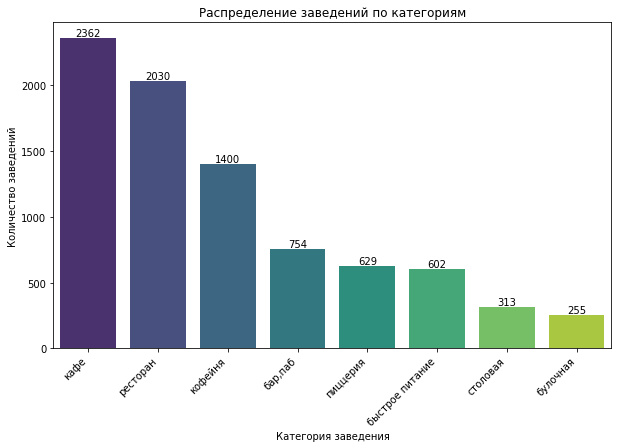

In [ ]:
# группировка данных по категориям и подсчет количества заведений в каждой категории
category_counts = data.groupby('category')['name'].count().sort_values(ascending=False)

# создание столбчатой диаграммы с использованием seaborn
plt.figure(figsize=(10, 6))
ax = sns.barplot(x=category_counts.index, y=category_counts.values, palette='viridis')

# добавление численных значений над каждым столбцом
for i, value in enumerate(category_counts.values):
    ax.text(i, value, str(round(value, 2)), ha='center', va='bottom', fontsize=10)

plt.title('Распределение заведений по категориям')
plt.xlabel('Категория заведения')
plt.ylabel('Количество заведений')
plt.xticks(rotation=45, ha='right')  # поворот меток по оси x для лучшей читаемости
plt.show()

Из предоставленных данных видно, что **наибольшее** количество заведений относится к следующим категориям:
- Кафе: 2362 заведения
- Ресторан: 2030 заведений
- Кофейня: 1400 заведения

Также присутствуют заведения в следующих категориях:
- Бар, паб: 754 заведений
- Пиццерия: 629 заведения
- Быстрое питание: 602 заведения

**Наименьшее** количество заведений находятся в категориях:
- Столовая: 313 заведений
- Булочная: 255 заведений

### Исследуем количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Построим визуализации. Проанализируем результаты и сделаем выводы.

In [ ]:
data.groupby('category')['seats'].median().sort_values(ascending=False)

category
ресторан           86.0
бар,паб            80.0
кофейня            78.0
столовая           75.0
быстрое питание    65.0
кафе               60.0
пиццерия           52.0
булочная           50.0
Name: seats, dtype: float64

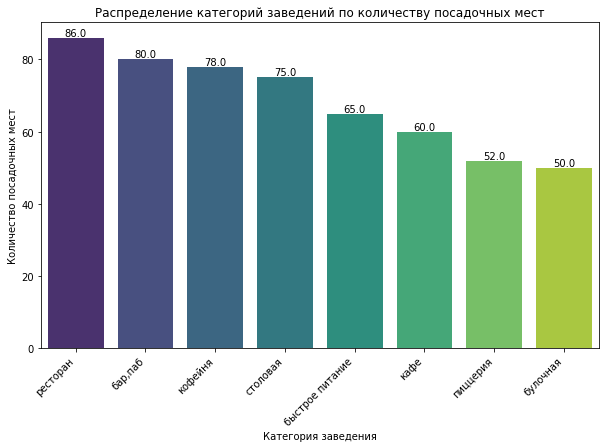

In [ ]:
# группировка данных по категориям и подсчет количества мест в каждой категории
seat_counts = data.groupby('category')['seats'].median().sort_values(ascending=False)

# создание столбчатой диаграммы с использованием seaborn
plt.figure(figsize=(10, 6))
ax = sns.barplot(x=seat_counts.index, y=seat_counts.values, palette='viridis')

# добавление численных значений над каждым столбцом
for i, value in enumerate(seat_counts.values):
    ax.text(i, value, str(round(value, 2)), ha='center', va='bottom', fontsize=10)

plt.title('Распределение категорий заведений по количеству посадочных мест')
plt.xlabel('Категория заведения')
plt.ylabel('Количество посадочных мест')
plt.xticks(rotation=45, ha='right')  # поворот меток по оси x для лучшей читаемости
plt.show()

Больше всего посадочных мест у ресторанов, а наименьшее у пиццерий и булочных.

### Рассмотрим и изобразим соотношение сетевых и несетевых заведений в датасете. Каких заведений больше?

In [ ]:
data.groupby('chain')['name'].count().sort_values(ascending=False)

chain
0    5169
1    3176
Name: name, dtype: int64

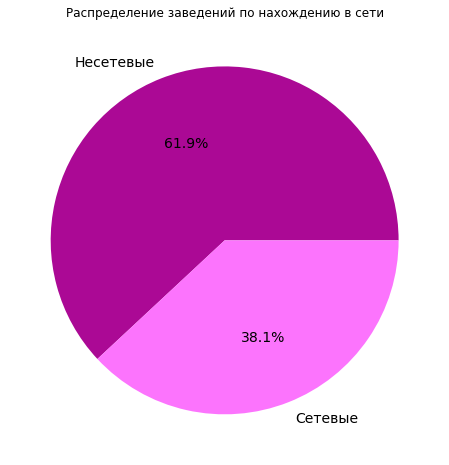

In [ ]:
# группировка данных по сетевым/несетевым и подсчет количества заведений в каждой категории
chain_counts = data.groupby('chain')['name'].count().sort_values(ascending=False)

# создание круговой диаграммы
plt.figure(figsize=(8, 8))
plt.pie(chain_counts, labels=['Несетевые', 'Сетевые'], autopct='%1.1f%%', textprops={'fontsize': 14}, colors=['#ab0995', '#fc74fd'])
plt.title('Распределение заведений по нахождению в сети')
plt.show()

В датасете большее количество заведений не являются сетевыми (5169 = 61.9%), являются же сетевыми 3176 заведение, то есть 38.1%.

### Какие категории заведений чаще являются сетевыми?
Исследуем данные и ответим на вопрос графиком.

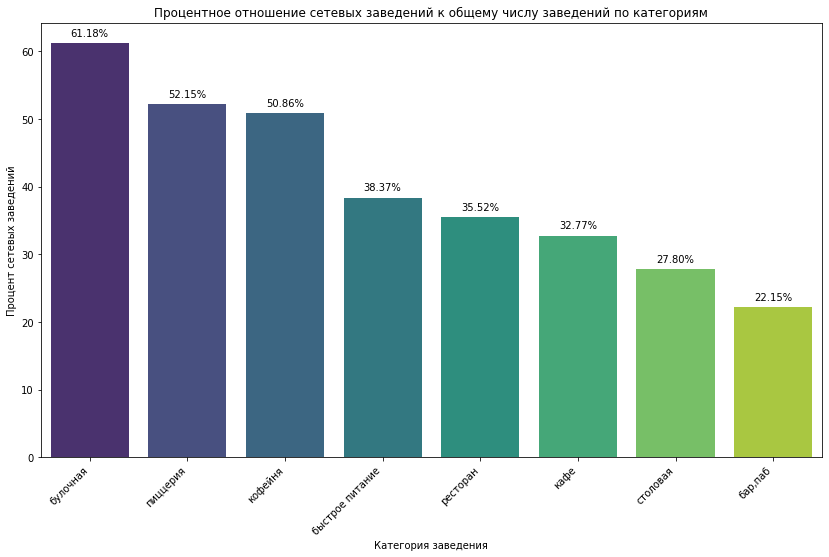

In [ ]:
# группировка данных по категориям и подсчет общего количества заведений каждой категории
category_count = data.groupby('category')['name'].count().reset_index(name='total_count')

# группировка данных по категориям и сетевости, подсчет количества сетевых заведений каждой категории
category_chain_count = data[data['chain'] == 1].groupby('category')['name'].count().reset_index(name='chain_count')

# объединение двух таблиц по категориям
merged_data = category_count.merge(category_chain_count, on='category', how='left')

# добавление столбца с долей сетевых заведений в каждой категории
merged_data['chain_ratio'] = merged_data['chain_count'] / merged_data['total_count'] * 100  # в процентах

# сортировка данных по процентному отношению сетевых заведений в убывающем порядке
merged_data = merged_data.sort_values(by='chain_ratio', ascending=False)

# создание столбчатой диаграммы с подписями
plt.figure(figsize=(14, 8))
barplot = sns.barplot(x='category', y='chain_ratio', data=merged_data, palette='viridis')

# добавление подписей с процентами
for p in barplot.patches:
    barplot.annotate(f'{p.get_height():.2f}%', (p.get_x() + p.get_width() / 2., p.get_height()),
                     ha='center', va='center', xytext=(0, 10), textcoords='offset points')

plt.title('Процентное отношение сетевых заведений к общему числу заведений по категориям')
plt.xlabel('Категория заведения')
plt.ylabel('Процент сетевых заведений')
plt.xticks(rotation=45, ha='right')
plt.show()

Сетевыми чаще являются булочные (61%), пиццерии (52%) и кофейни (50%), а реже всего - бары/пабы (22%) и столовые (27%).

### Сгруппируем данные по названиям заведений и найдем топ-15 популярных сетей в Москве.
Под популярностью понимается количество заведений этой сети в регионе. Построим подходящую для такой информации визуализацию. Знакомы ли эти сети? Есть ли какой-то признак, который их объединяет? К какой категории заведений они относятся?

In [ ]:
data[data['chain'] == 1].groupby('name')['name'].count().sort_values(ascending=False).head(15)

name
шоколадница                            117
домино'с пицца                          76
додо пицца                              74
one price coffee                        70
яндекс лавка                            68
cofix                                   65
prime                                   50
хинкальная                              44
кофепорт                                42
теремок                                 38
кулинарная лавка братьев караваевых     38
чайхана                                 37
cofefest                                32
буханка                                 32
му-му                                   27
Name: name, dtype: int64

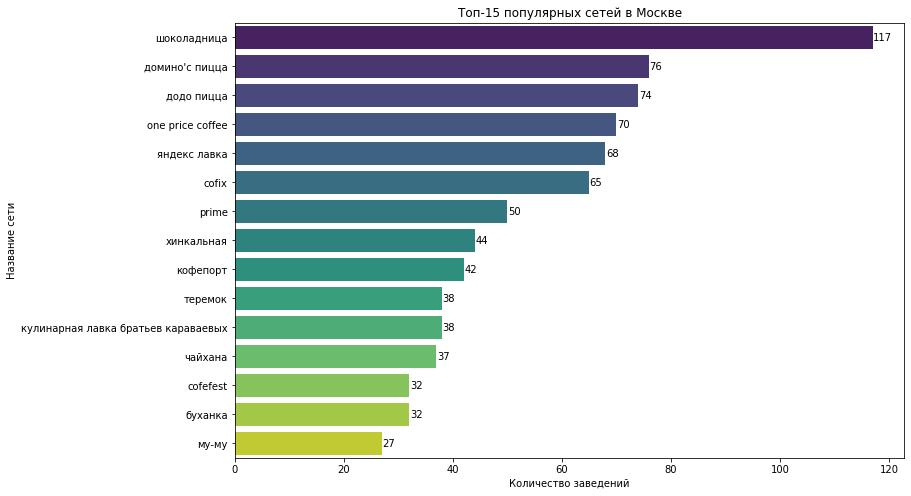

In [ ]:
# группировка данных по названиям заведений и подсчет количества в каждой сети
top_chains = data[data['chain'] == 1].groupby('name')['name'].count().sort_values(ascending=False).head(15)

# создание столбчатой диаграммы
plt.figure(figsize=(12, 8))
ax = sns.barplot(x=top_chains.values, y=top_chains.index, palette='viridis')

# добавление численных значений около каждого столбца
for i, value in enumerate(top_chains.values):
    ax.text(value + 0.1, i, str(value), va='center', fontsize=10)

plt.title('Топ-15 популярных сетей в Москве')
plt.xlabel('Количество заведений')
plt.ylabel('Название сети')
plt.show()

Наиболее популярным заведением является Шоколадница, после нее идет 2 пиццерии, кофейни и доставка продуктов на дом от Яндекс Лавки. Замыкает топ-15 Му-Му.

In [ ]:
# получение списка топ-15 популярных сетей
top_chains_list = data[data['chain'] == 1].groupby('name')['name'].count().sort_values(ascending=False).head(15).index

# фильтрация данных по этому списку
top_chains_data = data[data['name'].isin(top_chains_list)]

# проверим район, в которых находятся топовые заведения
top_chains_data.groupby('district')['name'].count().sort_values(ascending=False)

district
Центральный административный округ         215
Южный административный округ                89
Северный административный округ             87
Западный административный округ             85
Северо-Восточный административный округ     85
Восточный административный округ            79
Юго-Западный административный округ         70
Юго-Восточный административный округ        56
Северо-Западный административный округ      46
Name: name, dtype: int64

In [ ]:
# проверим категории, к которым относятся топовые заведения
top_chains_data.groupby('category')['name'].count().sort_values(ascending=False)

category
кофейня            333
ресторан           185
пиццерия           152
кафе                99
булочная            25
быстрое питание     12
бар,паб              4
столовая             2
Name: name, dtype: int64

In [ ]:
# проверим ценовой диапазон, к которому относятся топовые заведения
top_chains_data.groupby('price')['name'].count().sort_values(ascending=False)

price
средние          209
низкие            23
выше среднего      6
высокие            2
Name: name, dtype: int64

Можно сказать, что топ-15 сетей связывают несколько факторов, наиболее значимыми являются категория и ценовой диапазон. Так сети в большинстве представляют кофейни, а также рестораны и пиццерии, и средний ценовой диапазон.

### Какие административные районы Москвы присутствуют в датасете?
Отобразим общее количество заведений и количество заведений каждой категории по районам. Попробуем проиллюстрировать эту информацию одним графиком.

In [ ]:
data.groupby('district')['name'].count().sort_values(ascending=False)

district
Центральный административный округ         2242
Южный административный округ                891
Северо-Восточный административный округ     890
Северный административный округ             875
Западный административный округ             830
Восточный административный округ            788
Юго-Восточный административный округ        714
Юго-Западный административный округ         706
Северо-Западный административный округ      409
Name: name, dtype: int64

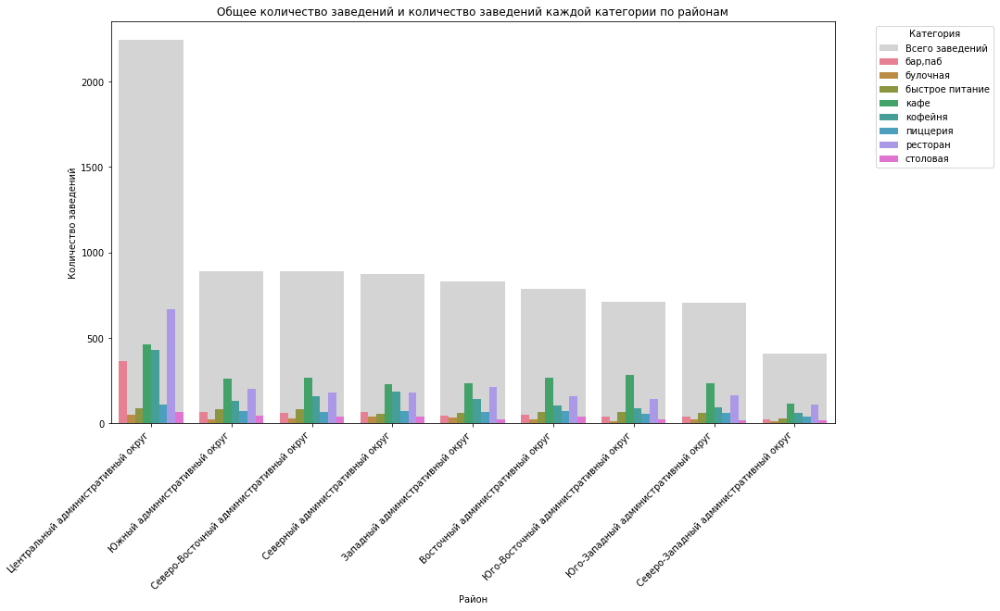

In [ ]:
# группировка данных по районам и подсчет общего количества заведений
total_count = data.groupby('district')['name'].count().sort_values(ascending=False).reset_index(name='total_count')

# группировка данных по районам и категориям, подсчет количества заведений каждой категории
category_count = data.groupby(['district', 'category'])['name'].count().reset_index(name='category_count')

# объединение двух таблиц по районам
merged_data = total_count.merge(category_count, on='district', how='left')

# создание столбчатой диаграммы
plt.figure(figsize=(14, 8))
sns.barplot(x='district', y='total_count', data=merged_data, color='#d4d4d4', label='Всего заведений')
sns.barplot(x='district', y='category_count', hue='category', data=merged_data, palette='husl')

plt.title('Общее количество заведений и количество заведений каждой категории по районам')
plt.xlabel('Район')
plt.ylabel('Количество заведений')
plt.legend(title='Категория', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45, ha='right')
plt.show()

Больше всего заведений находится в ЦАО (центральный административный округ). ЦАО является культурным и развлекательным центром города, куда стекаются все туристы и жители города для того. чтобы приятно провести время, также именно поэтому там много ресторанов и кафе, а также кофеен и баров/пабов. Наименее востребованный район - СЗАО (Северо-западный административный округ), в котором много спальных районов, и нет отличительных достопримечательностей, которые привлекали бы приезжих и жителей.

### Визуализируем распределение средних рейтингов по категориям заведений. Сильно ли различаются усреднённые рейтинги в разных типах общепита?

In [ ]:
data.groupby('category')['rating'].median().sort_values(ascending=False)

category
бар,паб            4.4
булочная           4.3
кофейня            4.3
пиццерия           4.3
ресторан           4.3
столовая           4.3
быстрое питание    4.2
кафе               4.2
Name: rating, dtype: float64

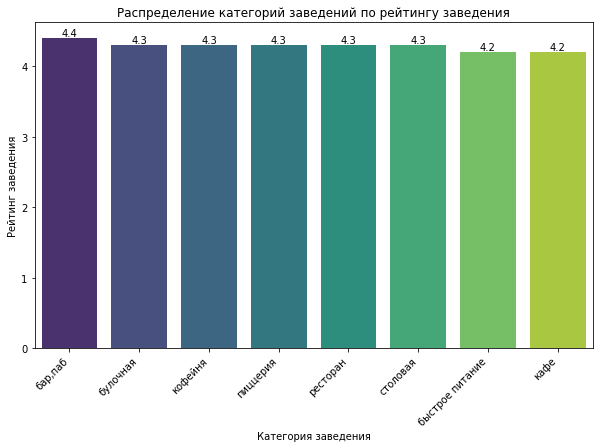

In [ ]:
# группировка данных по категориям и подсчет количества заведений в каждой категории
rating_counts = data.groupby('category')['rating'].median().sort_values(ascending=False)

# создание столбчатой диаграммы с использованием seaborn
plt.figure(figsize=(10, 6))
ax = sns.barplot(x=rating_counts.index, y=rating_counts.values, palette='viridis')

# добавление численных значений над каждым столбцом
for i, value in enumerate(rating_counts.values):
    ax.text(i, value, str(round(value, 2)), ha='center', va='bottom', fontsize=10)

plt.title('Распределение категорий заведений по рейтингу заведения')
plt.xlabel('Категория заведения')
plt.ylabel('Рейтинг заведения')
plt.xticks(rotation=45, ha='right')  # поворот меток по оси x для лучшей читаемости
plt.show()

Рейтинги разных категорий заведений мало отличаются друг от друга (на 0.2), однако наибольший рейтинг имеют бары/пабы, а наименьший кафе.

### Построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района.

In [ ]:
data.groupby('district')['rating'].median().sort_values(ascending=False)

district
Центральный административный округ         4.4
Восточный административный округ           4.3
Западный административный округ            4.3
Северный административный округ            4.3
Северо-Западный административный округ     4.3
Юго-Западный административный округ        4.3
Южный административный округ               4.3
Северо-Восточный административный округ    4.2
Юго-Восточный административный округ       4.2
Name: rating, dtype: float64

In [ ]:
# группируем данные по категории и вычисляем медиану для рейтинга
rating_counts = data.groupby('district')['rating'].median().sort_values(ascending=False)

# Преобразуем результат в DataFrame
rating_counts = pd.DataFrame({'district': rating_counts.index, 'rating': rating_counts.values})

# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_counts,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='RdPu',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

Наивысший рейтинг в центральном административном округе, а наименьший в юго-восточном и северо-восточном административных округах.

### Отобразим все заведения датасета на карте с помощью кластеров средствами библиотеки folium.

In [ ]:
# создаём карту Москвы
mm = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(mm)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}"
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
mm

### Найдем топ-15 улиц по количеству заведений. Построим график распределения количества заведений и их категорий по этим улицам. Попробуем проиллюстрировать эту информацию одним графиком.

In [ ]:
data.groupby('street')['name'].count().sort_values(ascending=False).head(15)

street
проспект мира             183
профсоюзная улица         122
ленинский проспект        107
проспект вернадского       97
дмитровское шоссе          88
каширское шоссе            77
варшавское шоссе           76
ленинградский проспект     72
ленинградское шоссе        70
мкад                       65
люблинская улица           60
улица вавилова             55
кутузовский проспект       53
пятницкая улица            48
алтуфьевское шоссе         47
Name: name, dtype: int64

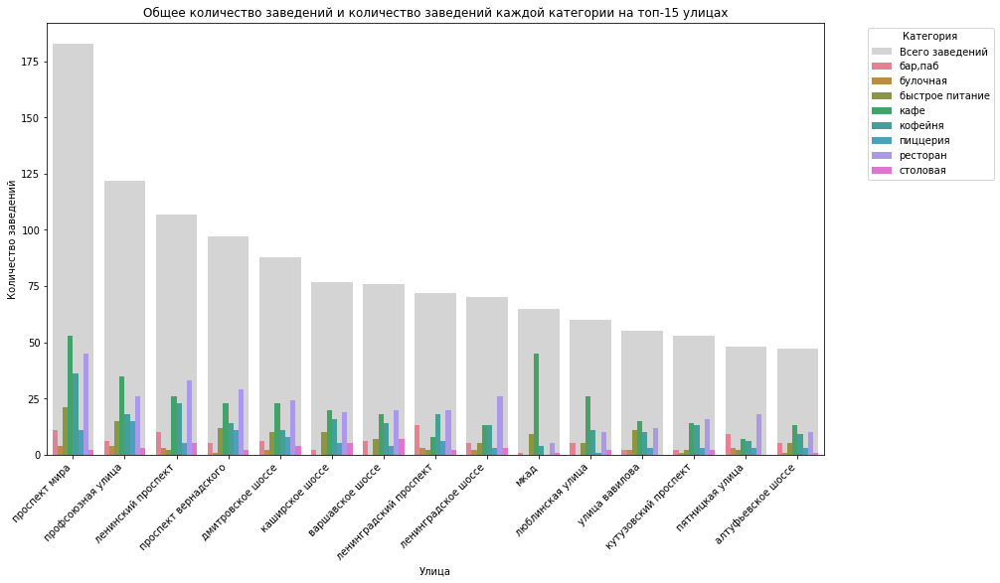

In [ ]:
# группировка данных по улицам и подсчет общего количества заведений
total_street_count = data.groupby('street')['name'].count().sort_values(ascending=False).head(15).reset_index(name='total_street_count')

# группировка данных по улицам и категориям, подсчет количества заведений каждой категории
street_count = data.groupby(['street', 'category'])['name'].count().reset_index(name='street_count')

# объединение двух таблиц по улицам
merged_data = total_street_count.merge(street_count, on='street', how='left')

# создание столбчатой диаграммы
plt.figure(figsize=(14, 8))
sns.barplot(x='street', y='total_street_count', data=merged_data, color='#d4d4d4', label='Всего заведений')
sns.barplot(x='street', y='street_count', hue='category', data=merged_data, palette='husl')

plt.title('Общее количество заведений и количество заведений каждой категории на топ-15 улицах')
plt.xlabel('Улица')
plt.ylabel('Количество заведений')
plt.legend(title='Категория', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45, ha='right')
plt.show()

Наибольшее количество заведений находится на Проспекте мира (при этом больше всего там кафе и ресторанов), меньше всего заведенйи из топ-15 улиц находится на улице Миклухо-Маклая. Выделяется также количество кафе на МКАДе, что обосновывается тем, что сама магистраль является крайне длинным объектом, и люди, едущие по ней, могут часто заходить в придорожные кафе.

### Найдем улицы, на которых находится только один объект общепита. Что можно сказать об этих заведениях?

In [ ]:
# uруппировка данных по улицам и подсчет количества заведений на каждой улице
street_lonely_counts = data.groupby('street')['name'].count().sort_values(ascending=True)

# отфильтруем улицы, на которых находится только одно заведение
streets_with_one_place = street_lonely_counts[street_lonely_counts == 1].index

# отобразим информацию о заведениях только на этих улицах
filtered_data = data[data['street'].isin(streets_with_one_place)]

In [ ]:
filtered_data.groupby('category')['name'].count().sort_values(ascending=False)

category
кафе               159
ресторан            93
кофейня             84
бар,паб             39
столовая            36
быстрое питание     23
пиццерия            15
булочная             8
Name: name, dtype: int64

In [ ]:
filtered_data.groupby('price')['name'].count().sort_values(ascending=False)

price
средние          120
выше среднего     29
высокие           22
низкие            11
Name: name, dtype: int64

Заведения, которые являются едиснтвенным заведением на определенной улице, являются в большинстве своем кафе со средним чеком.

### Как удалённость от центра влияет на цены в заведениях?
Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитаем медиану этого столбца для каждого района. Используем это значение в качестве ценового индикатора района. Построим фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализируем цены в центральном административном округе и других.

In [ ]:
district_data = data.groupby('district')['middle_avg_bill'].median().sort_values(ascending=False).reset_index(name='median_avg_bill')
district_data

,district,median_avg_bill
0,Западный административный округ,1000.0
1,Центральный административный округ,1000.0
2,Северо-Западный административный округ,700.0
3,Северный административный округ,650.0
4,Юго-Западный административный округ,600.0
5,Восточный административный округ,550.0
6,Северо-Восточный административный округ,500.0
7,Южный административный округ,500.0
8,Юго-Восточный административный округ,450.0


In [ ]:
mmm = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=district_data,
    columns=['district', 'median_avg_bill'],
    key_on='feature.name',
    fill_color='RdPu',
    fill_opacity=0.8,
    legend_name='Средний чек заведений по районам',
).add_to(mmm)

# выводим карту
mmm

Наиболее высокий средний чек в заведениях - в ЦАО и ЗАО, если с ЦАО всё ясно, то на счет ЗАО также можно добавить, что в ЗАО находятся одни из самых безопасных районов Москвы, которые пользуются спросом для проживания там людей с высокой заработной платой. Наименьшие чеки находятся в Северо-восточном, Южном и Юго-Восточном административных округах.

### Вывод
В первую очередь, в городе преобладают кафе (2362 заведений), рестораны (2030) и кофейни (1400), тогда как столовых (313) и булочных (255) гораздо меньше. Рестораны характеризуются самым большим количеством посадочных мест (86 мест), в то время как пиццерии и булочные ограничиваются меньшим пространством для посетителей.

При анализе типов заведений можно выделить, что большинство из них не являются сетевыми. Сетевыми чаще являются булочные (61%), пиццерии (52%) и кофейни (50%), а реже всего - бары/пабы (22%) и столовые (27%). Топ-15 сетевых заведений включает кофейни, рестораны и пиццерии, причем они часто предлагают средний ценовой уровень.

География заведений демонстрирует, что наибольшее количество из них сосредоточено в центральной части города, особенно в Центральном административном округе (ЦАО). В то время как другие административные округа, такие как Северо-западный, имеют значительно меньше заведений.

Рейтинги заведений различаются совсем мало (всего в 0.2), бары и пабы имеют наивысший рейтинг, а кафе - наименьший.

Анализ топ-15 улиц по количеству заведений показывает, что они в основном расположены в центре города, причем Проспект Мира выделяется на фоне остальных.

Интересно, что улицы с единственным заведением, как правило, представлены кафе с средним чеком. Анализ ценового диапазона в различных округах города показывает, что самые высокие средние чеки наблюдаются в центральном и западном округах.

В целом, эти выводы обобщают характеристики общественного питания в Москве и могут быть использованы для принятия бизнес-решений и планирования развития заведений.

## Открытие кофейни
Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Будем считать, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. Попробуем определить, осуществима ли мечта клиентов.

Построим визуализации. Попробуем дать рекомендацию для открытия нового заведения.

### Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?

In [ ]:
coffee_data = data.query('category == "кофейня"').reset_index(drop=True)

In [ ]:
# количество кофеен
coffee_data['name'].count()

1400

In [ ]:
# в каких районах
cd_count_district = coffee_data.groupby('district')['name'].count().sort_values(ascending=False)
cd_count_district

district
Центральный административный округ         428
Северный административный округ            186
Северо-Восточный административный округ    159
Западный административный округ            146
Южный административный округ               131
Восточный административный округ           103
Юго-Западный административный округ         96
Юго-Восточный административный округ        89
Северо-Западный административный округ      62
Name: name, dtype: int64

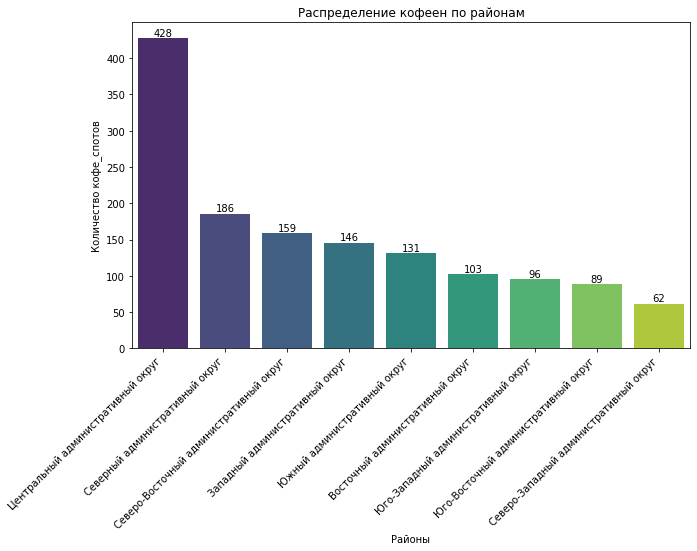

In [ ]:
# создание столбчатой диаграммы с использованием seaborn
plt.figure(figsize=(10, 6))
ax = sns.barplot(x=cd_count_district.index, y=cd_count_district.values, palette='viridis')

# добавление численных значений над каждым столбцом
for i, value in enumerate(cd_count_district.values):
    ax.text(i, value, str(round(value, 2)), ha='center', va='bottom', fontsize=10)

plt.title('Распределение кофеен по районам')
plt.xlabel('Районы')
plt.ylabel('Количество кофе_спотов')
plt.xticks(rotation=45, ha='right')  # поворот меток по оси x для лучшей читаемости
plt.show()

Всего в Москве 1400 кофеен. Большая часть которых находится в ЦАО (428).

### Есть ли круглосуточные кофейни?

In [ ]:
# посчитаем, сколько кофеен круглосоточны, а сколько нет
coffee_data.groupby('is_24/7')['name'].count().sort_values(ascending=False)

is_24/7
False    1326
True       59
Name: name, dtype: int64

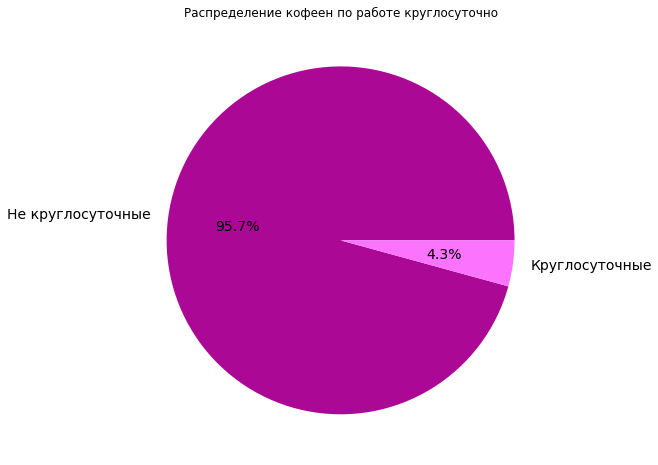

In [ ]:
# группировка данных по критерию круглосуточности и подсчет количества кофеен в каждой категории
is24_counts = coffee_data.groupby('is_24/7')['name'].count().sort_values(ascending=False)

# создание круговой диаграммы
plt.figure(figsize=(8, 8))
plt.pie(is24_counts, labels=['Не круглосуточные', 'Круглосуточные'], autopct='%1.1f%%', textprops={'fontsize': 14}, colors=['#ab0995', '#fc74fd'])
plt.title('Распределение кофеен по работе круглосуточно')
plt.show()

В Москве есть круглосуточные кофейни, однако их совсем мало (4.3%).

### Какие у кофеен рейтинги? Как они распределяются по районам?

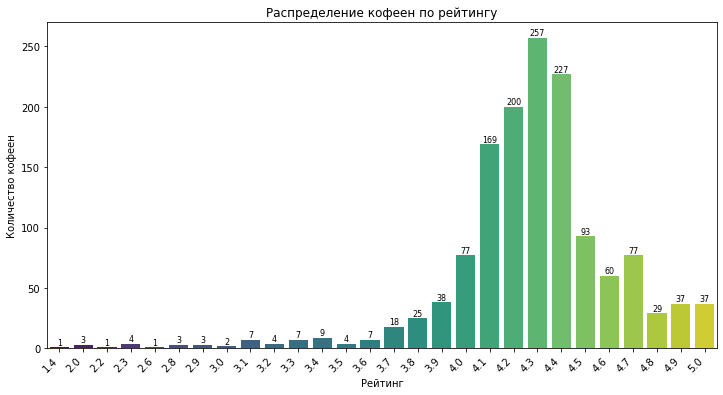

In [ ]:
# группировка данных по районам и подсчет медианного рейтинга
all_cd_rating_counts = coffee_data.groupby('rating')['name'].count().sort_values(ascending=False)

# создание столбчатой диаграммы
plt.figure(figsize=(12, 6))
ax = sns.barplot(x=all_cd_rating_counts.index, y=all_cd_rating_counts.values, palette='viridis')

# добавление числовых меток
for p in ax.patches:
    value = int(p.get_height())
    x = p.get_x() + p.get_width() / 2
    y = p.get_height() + 2
    ax.annotate(f'{value}', (x, y), fontsize=8, ha='center')

plt.title('Распределение кофеен по рейтингу')
plt.xlabel('Рейтинг')
plt.ylabel('Количество кофеен')
plt.xticks(rotation=45, ha='right')  # поворот меток по оси x для лучшей читаемости
plt.show()

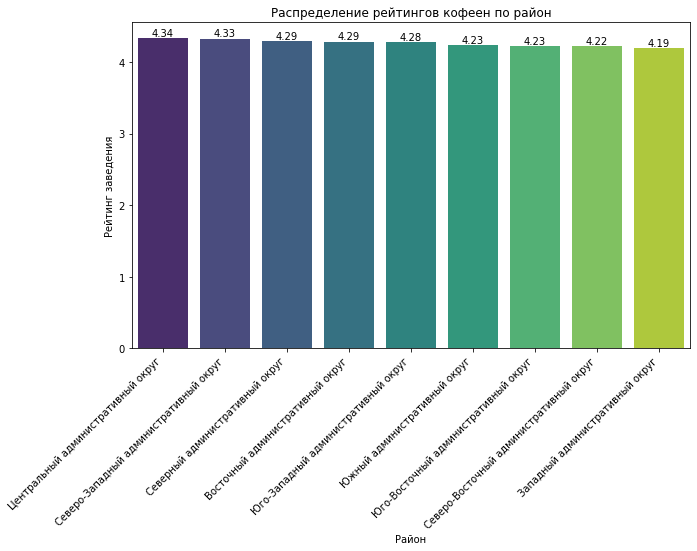

In [ ]:
# группировка данных по районам и подсчет медианного рейтинга
cd_rating_counts = coffee_data.groupby('district')['rating'].mean().sort_values(ascending=False)

# создание столбчатой диаграммы с использованием seaborn
plt.figure(figsize=(10, 6))
ax = sns.barplot(x=cd_rating_counts.index, y=cd_rating_counts.values, palette='viridis')

# добавление численных значений над каждым столбцом
for i, value in enumerate(cd_rating_counts.values):
    ax.text(i, value, str(round(value, 2)), ha='center', va='bottom', fontsize=10)

plt.title('Распределение рейтингов кофеен по район')
plt.xlabel('Район')
plt.ylabel('Рейтинг заведения')
plt.xticks(rotation=45, ha='right')  # поворот меток по оси x для лучшей читаемости
plt.show()

У кофеен в Москве в большинстве своем высокие рейтинги (у большинства 4.2-4.4 из 5). Наиболее высокий рейтинг у кофеен в ЦАО (среднее число - 4.34), наименьший в Западном округе (среднее число - 4.19).

### На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?
Стоимость кофе может сильно зависеть от района, в котором расположена кофейня, поэтому необходимо посомтреть на этот вопрос в разрезе метоположения кофейни.

In [ ]:
coffee_data.groupby('district')['middle_coffee_cup'].median().sort_values(ascending=False)

district
Юго-Западный административный округ        198.0
Центральный административный округ         190.0
Западный административный округ            187.0
Северо-Западный административный округ     165.0
Северо-Восточный административный округ    162.5
Северный административный округ            159.0
Южный административный округ               150.0
Юго-Восточный административный округ       147.5
Восточный административный округ           135.0
Name: middle_coffee_cup, dtype: float64

In [ ]:
# группируем данные по району и вычисляем медиану для чашки кофе
cup_counts = coffee_data.groupby('district')['middle_coffee_cup'].median().sort_values(ascending=False)

# Преобразуем результат в DataFrame
cup_counts = pd.DataFrame({'district': cup_counts.index, 'middle_coffee_cup': cup_counts.values})

# создаём карту Москвы
coffee_mm = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=cup_counts,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='RdPu',
    fill_opacity=0.8,
    legend_name='Средняя цена за кофе по районам',
).add_to(coffee_mm)

# выводим карту
coffee_mm

Цена кофе, на который стоит ориентироваться, зависит от района, в котором она будет находиться. Так в ЦАО и Юго-Западном округах цена варьируется около 190-198, а в Восточном - 135.

### Сколько кофеен являются сетевыми?

In [ ]:
coffee_data.groupby('chain')['name'].count().sort_values(ascending=False)

chain
1    712
0    688
Name: name, dtype: int64

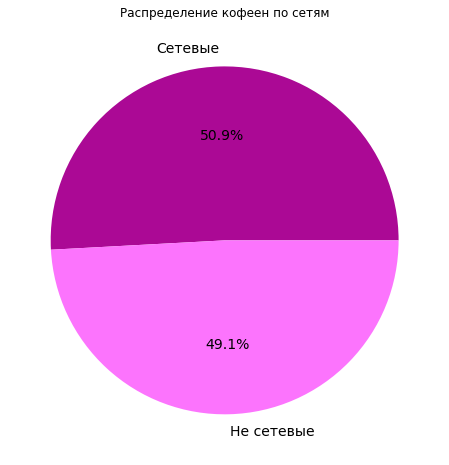

In [ ]:
# группировка данных по сети и подсчет количества кофеен в каждой категории
coffee_chain_count = coffee_data.groupby('chain')['name'].count().sort_values(ascending=False)

# создание круговой диаграммы
plt.figure(figsize=(8, 8))
plt.pie(coffee_chain_count, labels=['Сетевые', 'Не сетевые'], autopct='%1.1f%%', textprops={'fontsize': 14}, colors=['#ab0995', '#fc74fd'])
plt.title('Распределение кофеен по сетям')
plt.show()

Сетевые и несетевые кофейни занимают приблизительно одно число. Однако на 1.8% больше сетевых кофеен.

### Выводы и рекомендации по открытию кофейни

Исходя из представленной информации о рынке кофеен в Москве, можно дать несколько рекомендаций учредителям фонда:

1. **Стратегия размещения:**

Учитывая, что большинство кофеен находится в Центральном административном округе, целесообразно рассмотреть варианты размещения в этом округе или рядом с ним. Однако следует учитывать высокую конкуренцию в этом районе.

2. **Часы работы:**

Поскольку в Москве очень мало круглосуточных кофеен (4,3%), возможно, есть возможность выделить свою кофейню за счет более длительного времени работы. Это может привлечь клиентов, ищущих место, где можно провести время до позднего вечера.

3. **Ценовая стратегия:**

Ценовая стратегия зависит от района. Например, в Центральном и Юго-Западном округах, где цена на кофе составляет около 190-198 рублей, можно установить цены в этом диапазоне.

4. **Рейтинги и качество:**

Учитывая, что большинство кофеен имеют высокие рейтинги (4,2-4,4 балла из 5), очень важно сосредоточиться на качестве как кофе, так и обслуживания. Это будет ключевым фактором для привлечения клиентов и создания положительной репутации.

5. **Анализ конкурентов:**

Можно дополнительно проанализировать конкуренцию в различных округах, особенно в Западном округе, где средний рейтинг несколько ниже. Можно выявить потенциальные пробелы на рынке или области, где потребности клиентов удовлетворяются не полностью.

6. **Сеть:**

Хотя количество сетевых и несетевых кофеен примерно одинаково, учитывая, что сетевых кофеен на 1,8% больше, возможно, стоит изучить возможность создания сетевой или франчайзинговой модели для обеспечения масштабируемости.

## Презентация

Презентация: <https://drive.google.com/file/d/1xixhs_ogo_E7zAKyI8TYUiHpEI-oZEuw/view?usp=sharing>

## Общий вывод


В рамках данного проекта перед нами стояла задача изучения рынка общественного питания Москвы, и в частности изучения кофеен, для создания рекомендаций по открытию новый кофейни.

В датасете 5614 заведений. Изначальный датасет состоял из 8406 строк, 14 столбцов:
- `name` — название заведения;
- `address` — адрес заведения;
- `category` — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- `hours` — информация о днях и часах работы;
- `lat` — широта географической точки, в которой находится заведение;
- `lng` — долгота географической точки, в которой находится заведение;
- `rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- `price` — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- `avg_bill` — строка, которая хранит среднюю стоимость заказа в виде диапазона;
- `middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»;
- `middle_coffee_cup` — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»;
- `chain` — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
    0 — заведение не является сетевым,
    1 — заведение является сетевым;
- `district` — административный район, в котором находится заведение, например Центральный административный округ;
- `seats` — количество посадочных мест.

Есть пропуски в некоторых столбцах, которые касаются часов работы, среднего чека и количества посадочных мест. Столбцы хранят разные типы данных: строчные и числовые.

Была проведена предобработка, в ходе которой было обнаружено большое число пропусков, были найдены и удалены неявные дубликаты. Для дальнейшей работы также были изучены аномальные значения, и добавлены 2 столбца:
- столбец `street` с названиями улиц из столбца с адресом,
- столбец `is_24/7` с обозначением, что заведение работает ежедневно и круглосуточно (24/7).

**Промежуточные выводы**

**По всем категориям заведений:**
1. В первую очередь, в городе преобладают кафе (2362 заведений), рестораны (2030) и кофейни (1400), тогда как столовых (313) и булочных (255) гораздо меньше. Рестораны характеризуются самым большим количеством посадочных мест (86 мест), в то время как пиццерии и булочные ограничиваются меньшим пространством для посетителей.

2. При анализе типов заведений можно выделить, что большинство из них не являются сетевыми. Сетевыми чаще являются булочные, пиццерии и кофейни, а реже всего - бары/пабы и столовые. Топ-15 сетевых заведений включает кофейни, рестораны и пиццерии, причем они часто предлагают средний ценовой уровень.

3. География заведений демонстрирует, что наибольшее количество из них сосредоточено в центральной части города, особенно в Центральном административном округе (ЦАО). В то время как другие административные округа, такие как Северо-западный, имеют значительно меньше заведений.

4. Рейтинги заведений различаются совсем мало (всего в 0.2), бары и пабы имеют наивысший рейтинг, а кафе - наименьший.

5. Анализ топ-15 улиц по количеству заведений показывает, что они в основном расположены в центре города, причем Проспект Мира выделяется на фоне остальных.

6. Интересно, что улицы с единственным заведением, как правило, представлены кафе с средним чеком. Анализ ценового диапазона в различных округах города показывает, что самые высокие средние чеки наблюдаются в центральном и западном округах.


**По кофейням:**
1. Всего в Москве 1400 кофеен. Большая часть которых находится в ЦАО (428).
2. В Москве есть круглосуточные кофейни, однако их совсем мало (4.3%).
3. У кофеен в Москве в большинстве своем высокие рейтинги (у большинства 4.2-4.4 из 5). Наиболее высокий рейтинг у кофеен в ЦАО (среднее число - 4.34), наименьший в Западном округе (среднее число - 4.19).
4. Цена кофе, на который стоит ориентироваться, зависит от района, в котором она будет находиться. Так в ЦАО и Юго-Западном округах цена варьируется около 190-198, а в Восточном - 135.
5. Сетевые и несетевые кофейни занимают приблизительно одно число. Однако на 1.8% больше сетевых кофеен.

На основе этих выводов были сделаны следующие **рекомендации по открытию кофейни**:
1. Стратегия размещения:
Учитывая, что большинство кофеен находится в Центральном административном округе, целесообразно рассмотреть варианты размещения в этом округе или рядом с ним. Однако следует учитывать высокую конкуренцию в этом районе.

2. Часы работы:
Поскольку в Москве очень мало круглосуточных кофеен (4,3%), возможно, есть возможность выделить свою кофейню за счет более длительного времени работы. Это может привлечь клиентов, ищущих место, где можно провести время до позднего вечера.

3. Ценовая стратегия:
Ценовая стратегия зависит от района. Например, в Центральном и Юго-Западном округах, где цена на кофе составляет около 190-198 рублей, можно установить цены в этом диапазоне.

4. Рейтинги и качество:
Учитывая, что большинство кофеен имеют высокие рейтинги (4,2-4,4 балла из 5), очень важно сосредоточиться на качестве как кофе, так и обслуживания. Это будет ключевым фактором для привлечения клиентов и создания положительной репутации.

5. Анализ конкурентов:
Можно дополнительно проанализировать конкуренцию в различных округах, особенно в Западном округе, где средний рейтинг несколько ниже. Можно выявить потенциальные пробелы на рынке или области, где потребности клиентов удовлетворяются не полностью.

6. Сеть:
Хотя количество сетевых и несетевых кофеен примерно одинаково, учитывая, что сетевых кофеен на 1,8% больше, возможно, стоит изучить возможность создания сетевой или франчайзинговой модели для обеспечения масштабируемости.